# Programming Project #1: Hybrid Images

## CS445: Computational Photography - Fall 2019

### Part I: Hybrid Images

In [1]:
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy import signal

import utils

In [2]:
%matplotlib notebook

In [3]:
im1_file = "cat.jpg"
im2_file = "Bengal-tiger.jpg"

im1 = cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE)

In [4]:
pts_im1 = utils.prompt_eye_selection(im1)

<IPython.core.display.Javascript object>

TypeError: Image data of dtype object cannot be converted to float

<IPython.core.display.Javascript object>


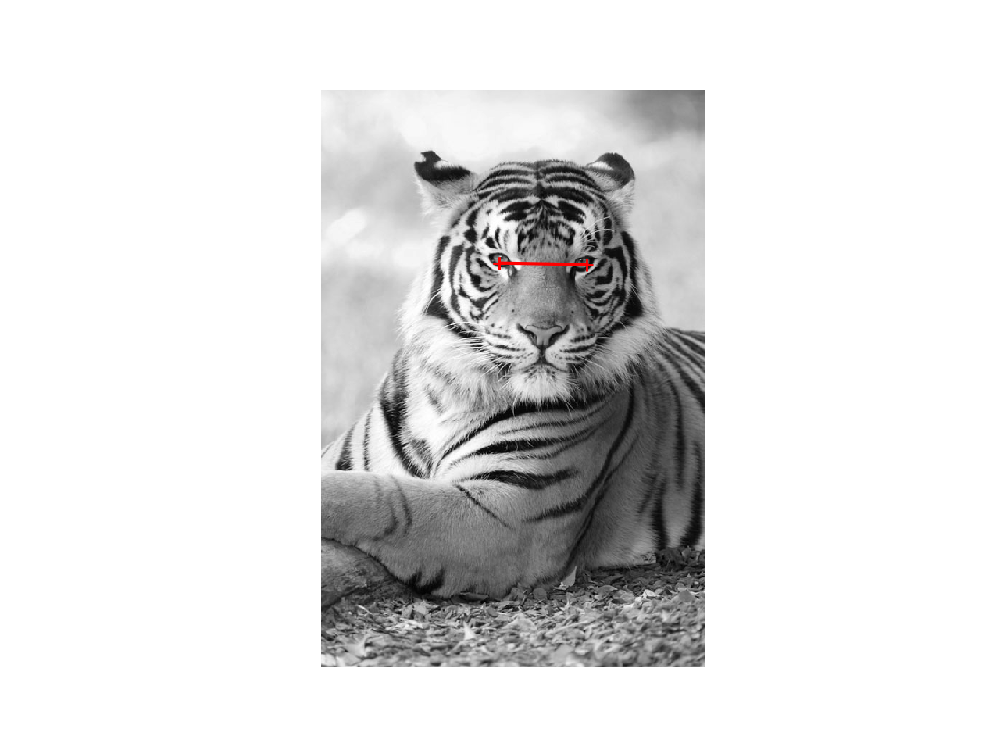

In [285]:
pts_im2 = utils.prompt_eye_selection(im2)

In [286]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [287]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


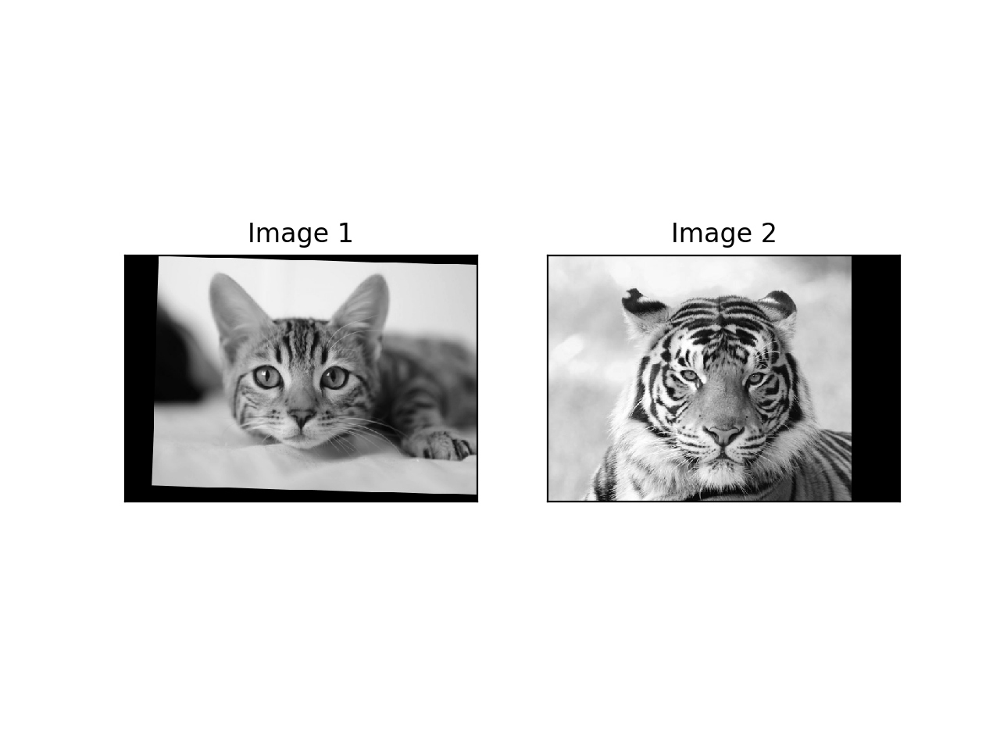

In [288]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [7]:
def hybridImage(im1, im2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array. (low freq)
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array. (high freq)
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''    
    # first let's generate these two filters
    cut_off_half_period_low = 8 # set to 4
    low_kernel_half_size = int(cut_off_half_period_low*cutoff_low)
    low_pass_filter = utils.gaussian_kernel(cutoff_low, low_kernel_half_size)
    
    cut_off_half_period_high = 8
    high_kernel_half_size = int(cut_off_half_period_high*cutoff_high)
    high_pass_filter_guassian = utils.gaussian_kernel(cutoff_high, high_kernel_half_size)
    high_pass_filter_impulse = signal.unit_impulse(high_pass_filter_guassian.shape, 'mid')
    high_pass_filter = high_pass_filter_impulse - high_pass_filter_guassian
    
    # filting 
    # first, initializing the image
    
    # for the RGB input, extract it into three single colored (height, width) layers
    # and then do the filtering operation for each layer
    
    # initializing the output_lowpass
    output_lowpass = np.zeros(im2.shape)
    #frequency_im2 = np.imag(np.zeros((max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1), max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1)))) 
    #frequency_fl2 = np.imag(np.zeros((max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1), max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1))))
    frequency_im2=[]
    frequency_fl2=[]
    if len(output_lowpass.shape) == 3:
        for color_axis_index in range(im2.shape[-1]):
            simple_color_layer = im1[:,:,color_axis_index]
            simple_color_layer_out, im_fft, fil_fft = filter_image(simple_color_layer, low_pass_filter)
            output_lowpass[:,:,color_axis_index] = simple_color_layer_out
            frequency_im2.append(im_fft)
            frequency_fl2.append(fil_fft)
    else:
        output_lowpass, im_fft, fil_fft = filter_image(im2, low_pass_filter)
        frequency_im2.append(im_fft)
        frequency_fl2.append(fil_fft)
        
        
    # initializing the output_lowpass
    output_highpass = np.zeros(im1.shape)
    #frequency_im1 = np.imag(np.zeros((max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1), max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1))))
    #frequency_fl1 = np.imag(np.zeros((max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1), max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1))))
    frequency_im1=[]
    frequency_fl1=[]


    if len(output_highpass.shape) == 3:
        for color_axis_index in range(im2.shape[-1]):
            simple_color_layer = im2[:,:,color_axis_index]
            simple_color_layer_out, im_fft, fil_fft = filter_image(simple_color_layer, high_pass_filter)
            output_highpass[:,:,color_axis_index] = simple_color_layer_out
            frequency_im1.append(im_fft)
            frequency_fl1.append(fil_fft)
    else:
        output_highpass, im_fft, fil_fft = filter_image(im1, high_pass_filter)
        frequency_im1.append(im_fft)
        frequency_fl1.append(fil_fft)
    
    return output_lowpass+output_highpass
        
        
        
def filter_image(im, fil): 
    '''
    im: H x W floating point numpy ndarray representing image in grayscale fil: M x M floating point numpy ndarray representing 2D filter
    '''
    H, W = im.shape
    # print(H, W)
    hs = fil.shape[0] // 2 # half of filter size
    
    # symmetric padding the image to avoid losing information in the boundaries
    # we suppose the image has size larger than the filter
    '''    
    padded_im = np.zeros((H+2*hs, W+2*hs))
    
    for i in range(padded_im.shape[0]):
        if i < hs:
            padded_im[i, hs:hs+W] = np.copy(im[hs - i])
        elif i >= hs and i < H + hs:
            padded_im[i, hs:hs+W] = np.copy(im[i-hs])
        else:
            padded_im[i, hs:hs+W] = np.copy(im[2*H - i])
    for j in range(padded_im.shape[1]):
        if j < hs:
            padded_im[:,j] = np.copy(padded_im[:,2*hs - j])
        elif j >= hs and j < W + hs:
            continue
        else:
            padded_im[:,j] = np.copy(padded_im[:,2*(W+hs) - j])
    '''
    fftsize = max(H+2*hs, W+2*hs, 1024) # should be order of 2 (for speed) and include padding
    im_fft = np.fft.fft2(im, (fftsize, fftsize)) 
    # plot_spectrum(im_fft)
    #im_fft_to_display = np.log(np.abs(im_fft))/np.max(np.log(np.abs(im_fft)))*255
    fil_fft = np.fft.fft2(fil, (fftsize, fftsize)) 
    # plot_spectrum(fil_fft)
    #fil_fft_to_display = np.log(np.abs(fil_fft))/np.max(np.log(np.abs(fil_fft)))*255
    im_fil_fft = im_fft * fil_fft
    im_fil = np.fft.ifft2(im_fil_fft)
    im_fil = im_fil[hs:hs + H, hs:hs + W] 
    
    # print(im_fil.shape)
    im_fil = np.real(im_fil)
    utils.interactive_crop(im_fil)

    return im_fil, im_fft, fil_fft



In [290]:
def hybridImage_fft(im1, im2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array. (low freq)
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array. (high freq)
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return four lists with the frequency arrayes of 2 inputs and 2 filters
    '''    
    # first let's generate these two filters
    cut_off_half_period_low = 8 # set to 4
    low_kernel_half_size = int(cut_off_half_period_low*cutoff_low)
    low_pass_filter = utils.gaussian_kernel(cutoff_low, low_kernel_half_size)
    
    cut_off_half_period_high = 8
    high_kernel_half_size = int(cut_off_half_period_high*cutoff_high)
    high_pass_filter_guassian = utils.gaussian_kernel(cutoff_high, high_kernel_half_size)
    high_pass_filter_impulse = signal.unit_impulse(high_pass_filter_guassian.shape, 'mid')
    high_pass_filter = high_pass_filter_impulse - high_pass_filter_guassian
    
    # filting 
    # first, initializing the image
    
    # for the RGB input, extract it into three single colored (height, width) layers
    # and then do the filtering operation for each layer
    
    # initializing the output_lowpass
    output_lowpass = np.zeros(im2.shape)
    #frequency_im2 = np.imag(np.zeros((max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1), max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1)))) 
    #frequency_fl2 = np.imag(np.zeros((max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1), max(im2.shape[0]+low_pass_filter.shape[0]-1, im2.shape[1]+low_pass_filter.shape[1]-1))))
    frequency_im2=[]
    frequency_fl2=[]
    if len(output_lowpass.shape) == 3:
        for color_axis_index in range(im2.shape[-1]):
            simple_color_layer = im1[:,:,color_axis_index]
            simple_color_layer_out, im_fft, fil_fft = filter_image(simple_color_layer, low_pass_filter)
            output_lowpass[:,:,color_axis_index] = simple_color_layer_out
            frequency_im2.append(im_fft)
            frequency_fl2.append(fil_fft)
    else:
        output_lowpass, im_fft, fil_fft = filter_image(im2, low_pass_filter)
        frequency_im2.append(im_fft)
        frequency_fl2.append(fil_fft)
        
        
    # initializing the output_lowpass
    output_highpass = np.zeros(im1.shape)
    #frequency_im1 = np.imag(np.zeros((max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1), max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1))))
    #frequency_fl1 = np.imag(np.zeros((max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1), max(im1.shape[0]+im1.shape[0]-1, im1.shape[1]+im1.shape[1]-1))))
    frequency_im1=[]
    frequency_fl1=[]


    if len(output_lowpass.shape) == 3:
        for color_axis_index in range(im2.shape[-1]):
            simple_color_layer = im2[:,:,color_axis_index]
            simple_color_layer_out, im_fft, fil_fft = filter_image(simple_color_layer, high_pass_filter)
            output_highpass[:,:,color_axis_index] = simple_color_layer_out
            frequency_im1.append(im_fft)
            frequency_fl1.append(fil_fft)
    else:
        output_highpass, im_fft, fil_fft = filter_image(im1, high_pass_filter)
        frequency_im1.append(im_fft)
        frequency_fl1.append(fil_fft)
    
    return frequency_im1, frequency_im2, frequency_fl1, frequency_fl2

def freqency_sum(frequency_im_or_fl):
    frequency_im_sum = frequency_im_or_fl[0]
    for i in range(len(frequency_im_or_fl)):
        if i > 0:
            frequency_im_sum += frequency_im_or_fl[i]
    return frequency_im_sum 


def display_frequency_image(frequency_image):
    '''
    frequency_image: H x W floating point numpy ndarray representing image after FFT
    '''
    shifted_image = np.fft.fftshift(frequency_image) 
    amplitude_image = np.abs(shifted_image) 
    log_amplitude_image = np.log(amplitude_image) 
    fig = plt.figure() 
    plt.imshow(log_amplitude_image) #cmap='brg') 
    plt.colorbar()
    plt.show()


def plot_spectrum(im_fft, y_range, x_range):
    from matplotlib.colors import LogNorm
    # A logarithmic colormap
    plt.imshow(np.log(np.abs(im_fft)), norm=LogNorm(vmin=5))
    plt.xlim(x_range)
    plt.ylim(y_range)
    plt.colorbar()

<IPython.core.display.Javascript object>


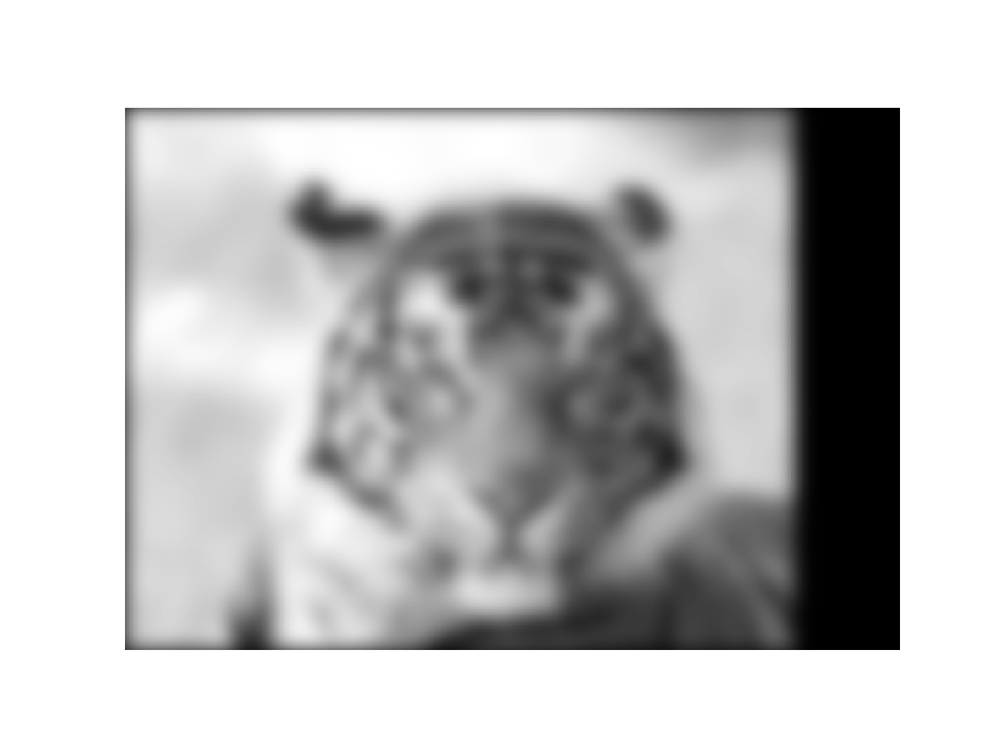

<IPython.core.display.Javascript object>


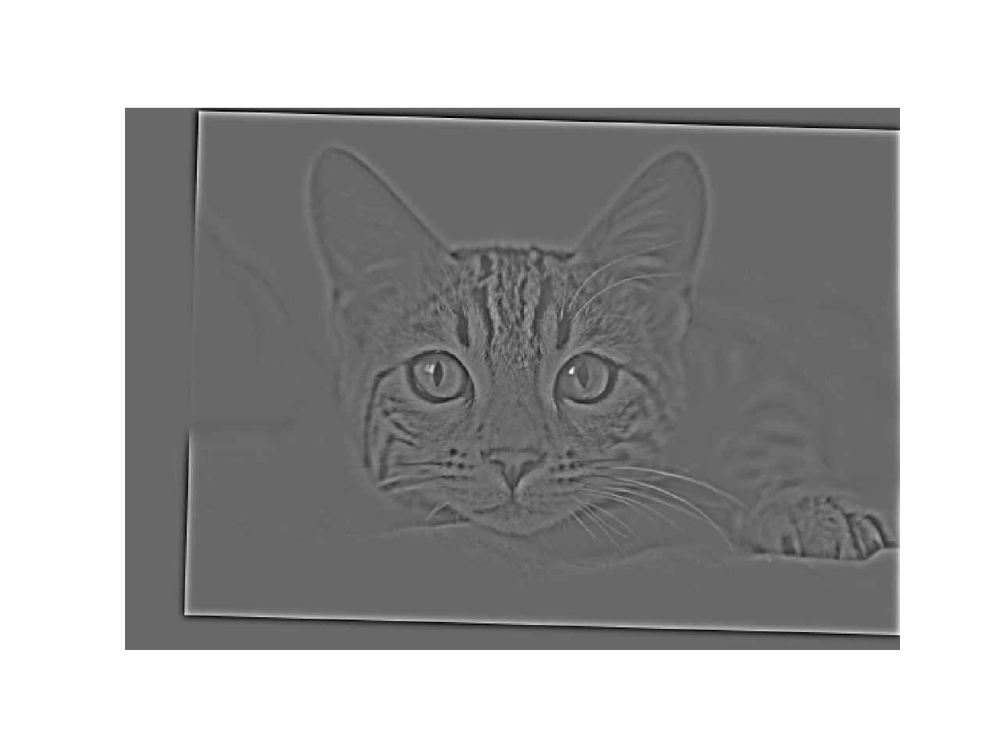

<IPython.core.display.Javascript object>


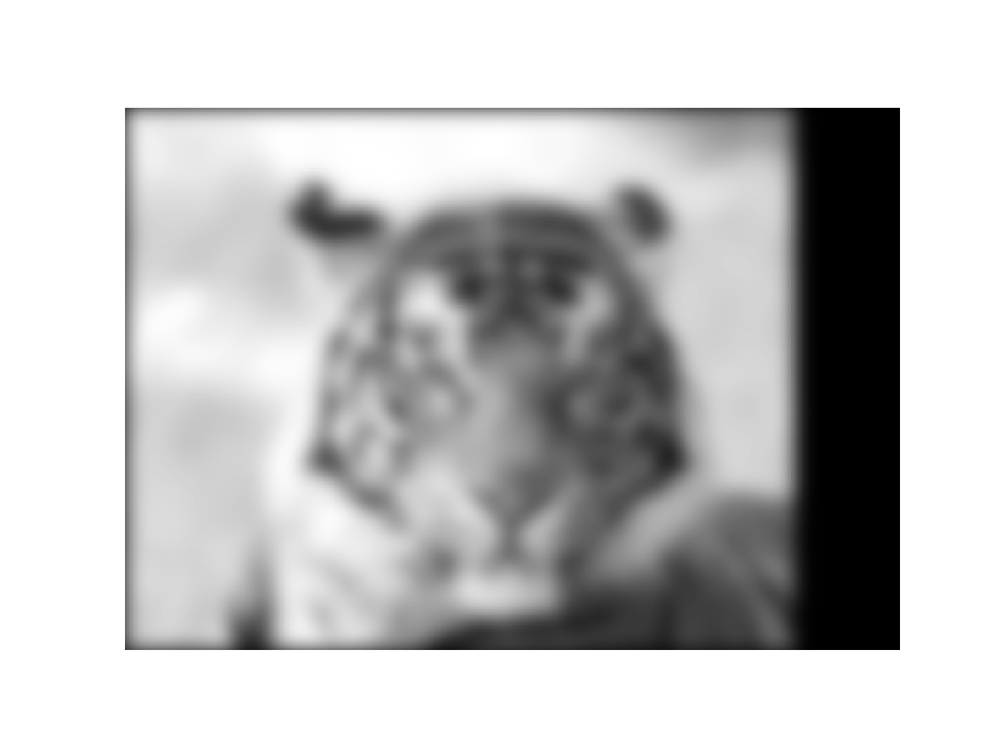

<IPython.core.display.Javascript object>


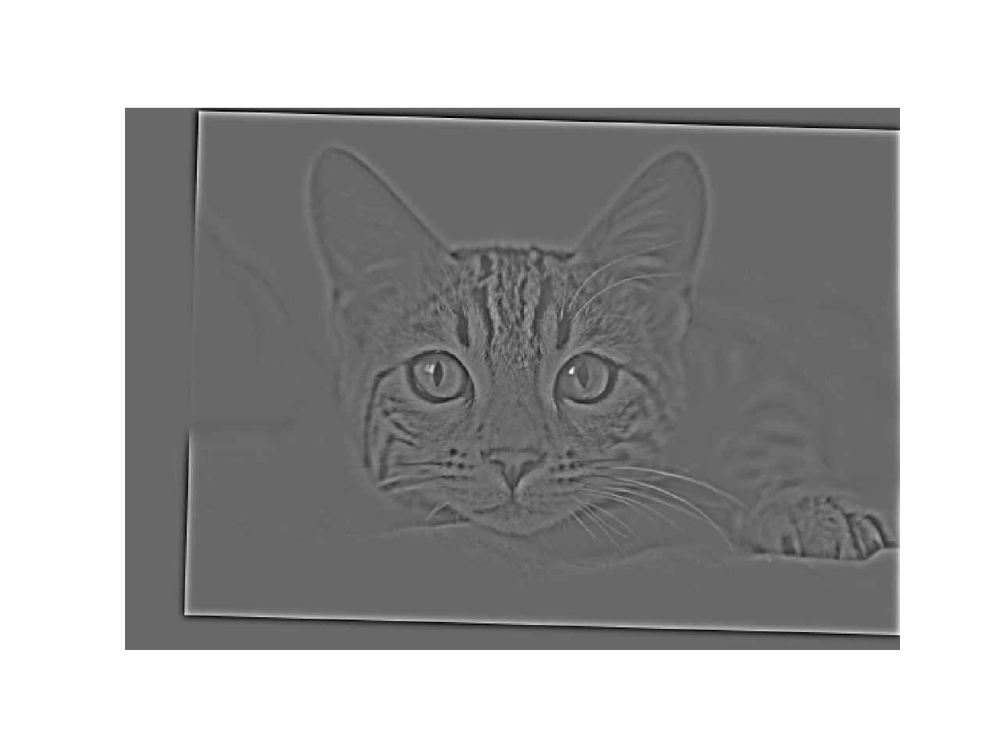

In [295]:
arbitrary_value = 20  # you should choose meaningful values; you might want to set to a fraction of image size
cutoff_low = 8
cutoff_high = 3

frequency_im1, frequency_im2, frequency_fl1, frequency_fl2 = hybridImage_fft(im1, im2, cutoff_low, cutoff_high)
im_hybrid = hybridImage(im1, im2, cutoff_low, cutoff_high)

<IPython.core.display.Javascript object>


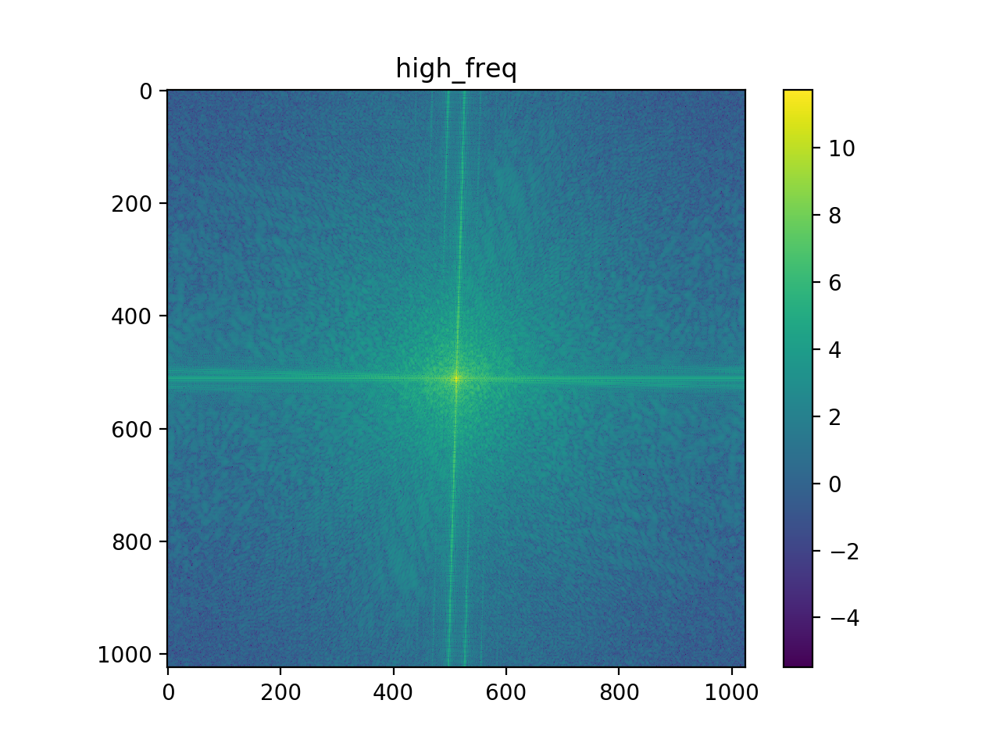

<IPython.core.display.Javascript object>


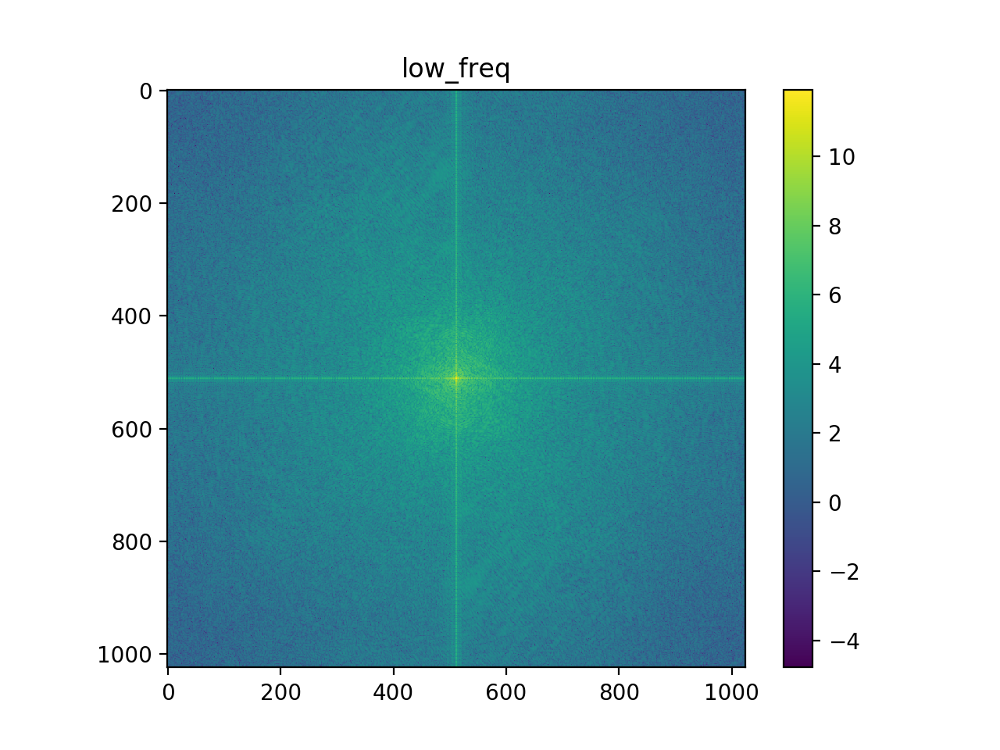

Text(0.5, 1.0, 'low_freq')

In [292]:
display_frequency_image(frequency_im1[0])
plt.title('high_freq')
display_frequency_image(frequency_im2[0])
plt.title('low_freq')

<IPython.core.display.Javascript object>


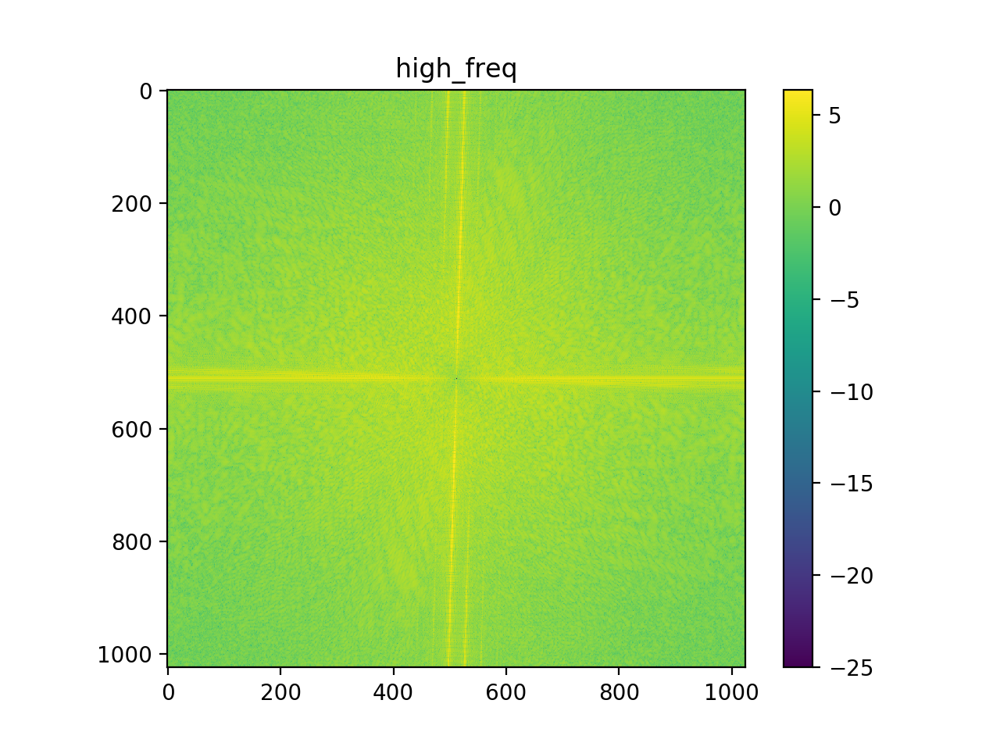

/Users/jinboci/Documents/anaconda3/envs/cs445/lib/python3.6/site-packages/ipykernel_launcher.py:86: RuntimeWarning: divide by zero encountered in log


<IPython.core.display.Javascript object>


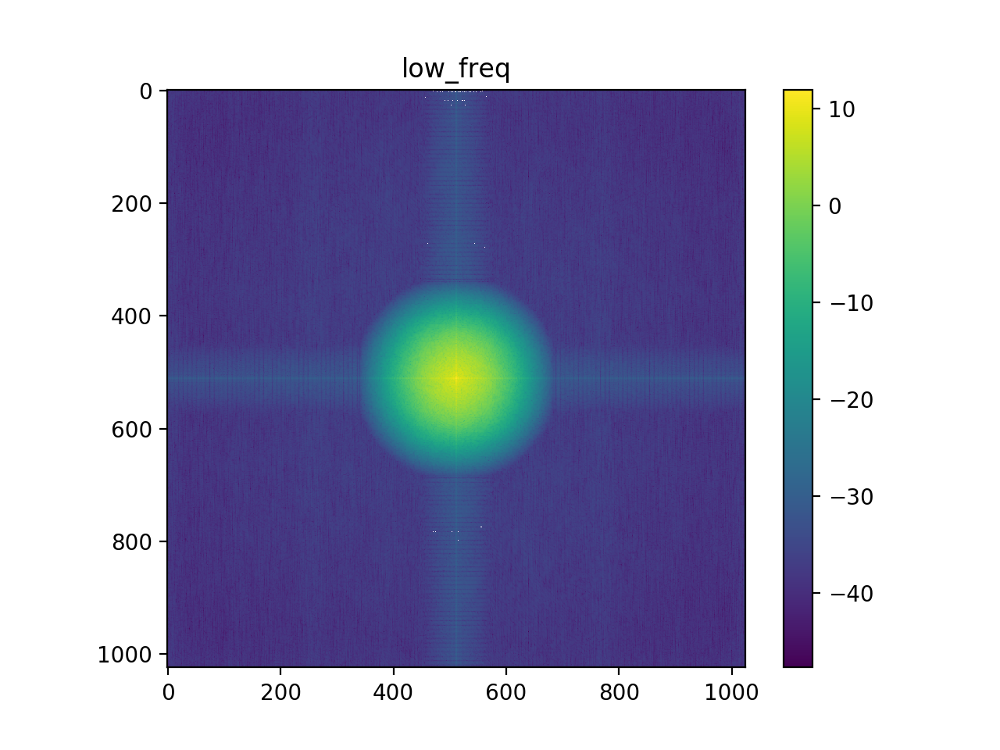

Text(0.5, 1.0, 'low_freq')

In [293]:
display_frequency_image(frequency_fl1[0]*frequency_im1[0])
plt.title('high_freq')
display_frequency_image(frequency_fl2[0]*frequency_im2[0])
plt.title('low_freq')

In [242]:
print(np.max(im_hybrid))

1.3525370936458576


<IPython.core.display.Javascript object>


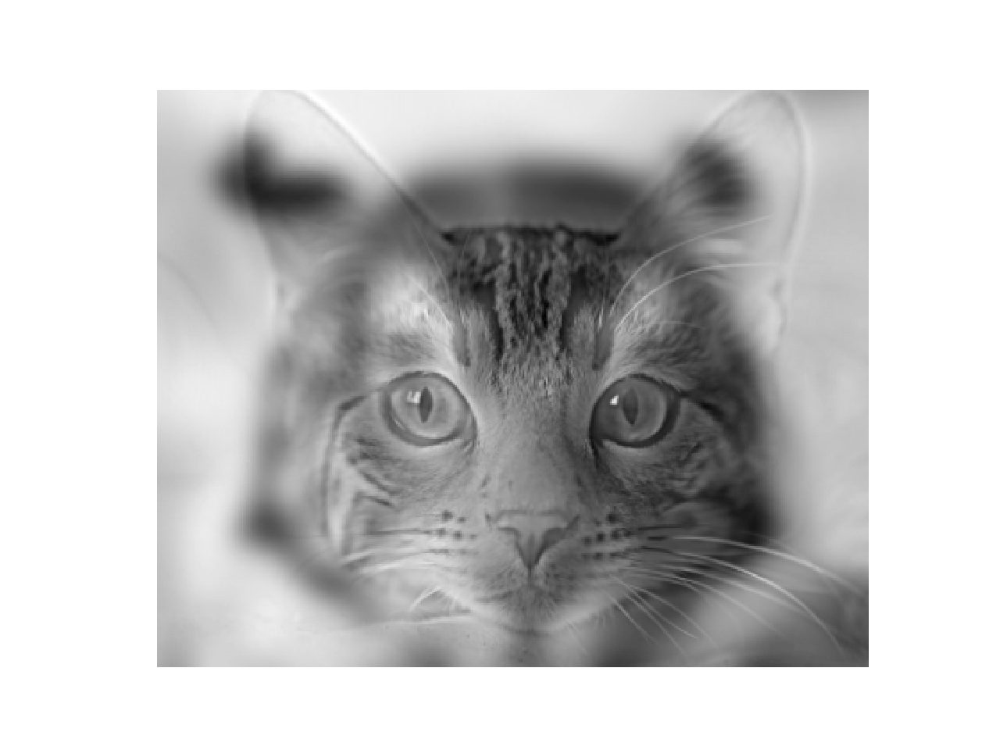

In [297]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(im_hybrid)

<IPython.core.display.Javascript object>


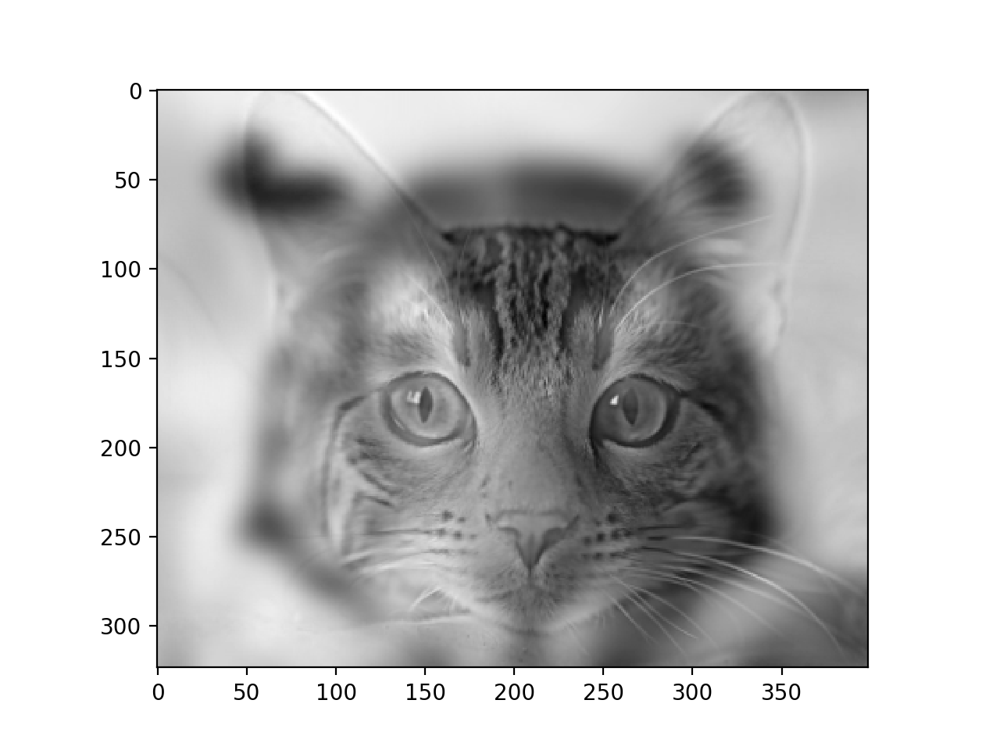

In [298]:
plt.figure()
plt.imshow(cropped_object['cropped_image'], cmap='gray')

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

The goal is to improve the contrast of the images. The poor constrast could be due to blurring in the capture process or due to the intensities not covering the full range. Choose an image (ideally one of yours, but from web is ok) that has poor contrast and fix the problem. Potential fixes include Laplacian filtering, gamma correction, and histogram equalization. Explain why you chose your solution.

In [8]:
# laplacian filtering
def laplacian_filtering(im, std, kernel_half_size):
    filter_guassian = utils.gaussian_kernel(std, kernel_half_size)
    filter_impulse = signal.unit_impulse(filter_guassian.shape, 'mid')
    laplacian_filter = filter_impulse - filter_guassian
    
    output_im = np.copy(im)
    if len(im.shape) == 3:
        if len(output_im.shape) == 3:
            for color_axis_index in range(im.shape[-1]):
                simple_color_layer = im[:,:,color_axis_index]
                simple_color_layer_out = filter_image(simple_color_layer, laplacian_filter)[0]
                output_im[:,:,color_axis_index] = simple_color_layer_out
        else:
            output_im = filter_image(im, laplacian_filter)[0]
        
    return output_im
        
# gamma correction
def gamma_correction(im, gamma):
    output = 255*(im/255)**gamma
    return output.astype(int)


# histogram equalization
def histogram_equalization(im, alpha):
    # just following the algorithm on the slide
    # Compute cumulative histogram
    # suppose all the pixel values are in [0, 255]
    h = np.zeros(256)
    c = np.zeros(256)
    h_new = np.zeros(256)
    c_new = np.zeros(256)
    output_im = np.copy(im)
    if len(output_im.shape) == 3:
        for color_idx in range(im.shape[-1]):
            for i in range(im.shape[0]):
                for j in range(im.shape[1]):
                    h[int(im[i,j,color_idx])] += 1
                    c[int(im[i,j,color_idx])] = h[int(im[i,j,color_idx])] + c[int(im[i,j,color_idx]) - 1]
            
            for i in range(im.shape[0]):
                for j in range(im.shape[1]):
                    output_im[i,j,color_idx] = alpha * c[int(im[i,j,color_idx])]/im.size *255 + (1- alpha) * int(im[i,j,color_idx])
        for color_idx in range(im.shape[-1]):
            for i in range(output_im.shape[0]):
                for j in range(output_im.shape[1]):
                    h_new[int(output_im[i,j,color_idx])] += 1
                    c_new[int(output_im[i,j,color_idx])] = h_new[int(output_im[i,j,color_idx])] + c_new[int(output_im[i,j,color_idx]) - 1]
    else:
        for i in range(im.shape[0]):
            for j in range(im.shape[1]):
                h[int(im[i,j])] += 1
                c[int(im[i,j])] = h[int(im[i,j])] + c[int(im[i,j]) - 1]
        for i in range(im.shape[0]):
            for j in range(im.shape[1]):
                h_new[int(output_im[i,j])] += 1
                c_new[int(output_im[i,j])] = h_new[int(output_im[i,j])] + c_new[int(output_im[i,j]) - 1]
        for i in range(im.shape[0]):
            for j in range(im.shape[1]):
                output_im[i,j] = alpha * c[int(im[i,j])]/im.size *255 + (1- alpha) * int(im[i,j])    
    
    return output_im, h, c, h_new, c_new
        


<IPython.core.display.Javascript object>


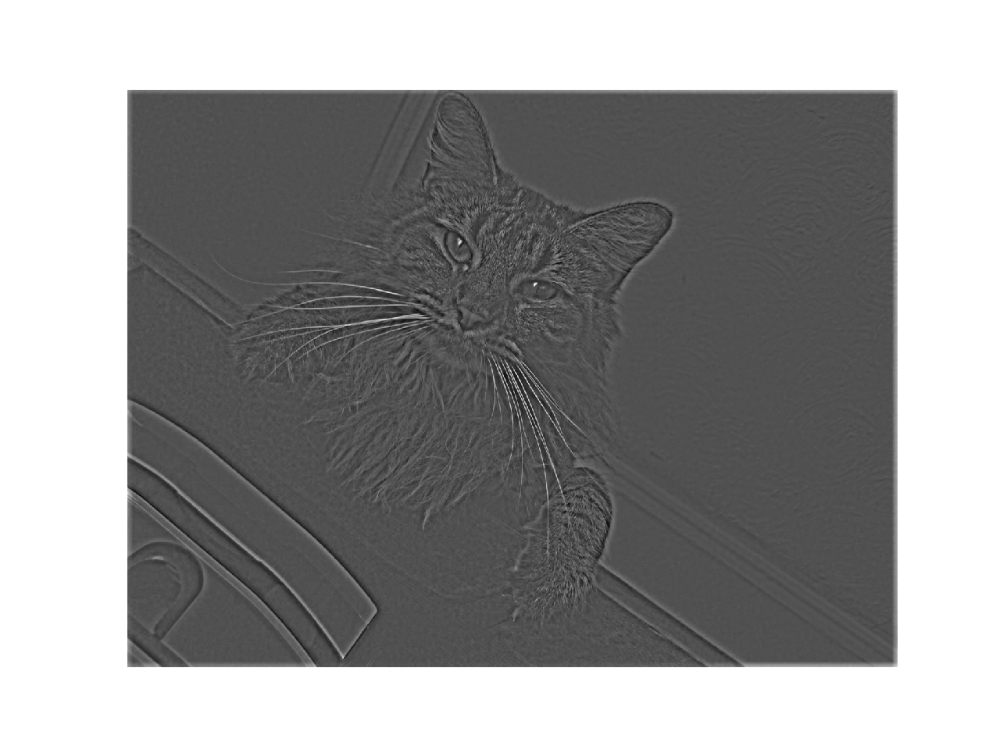

<IPython.core.display.Javascript object>


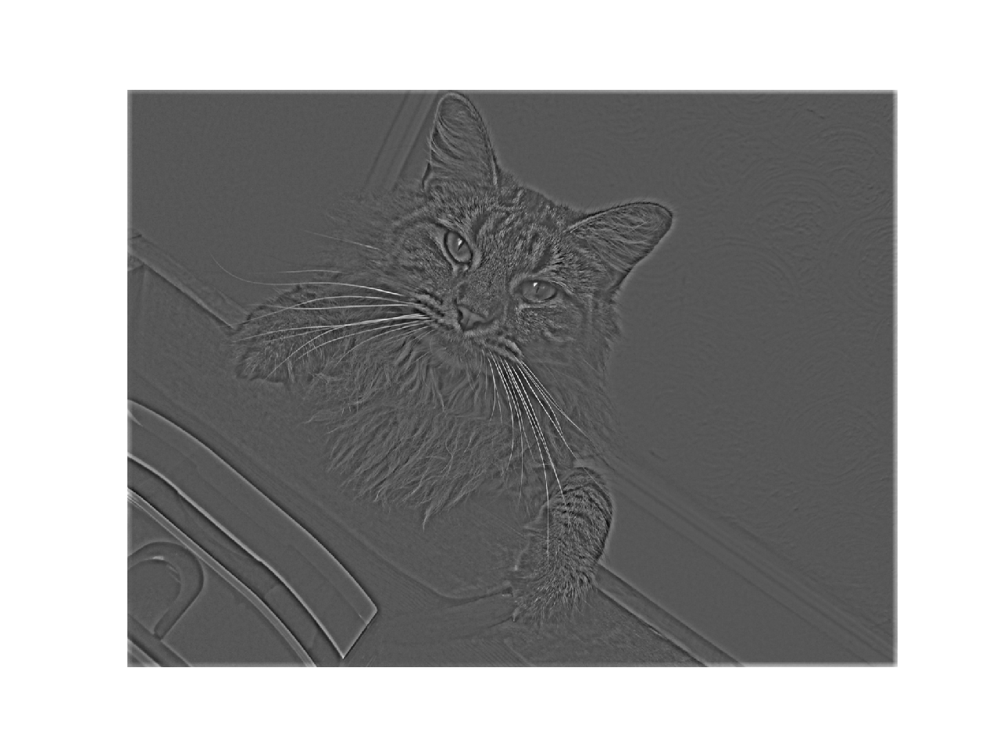

<IPython.core.display.Javascript object>


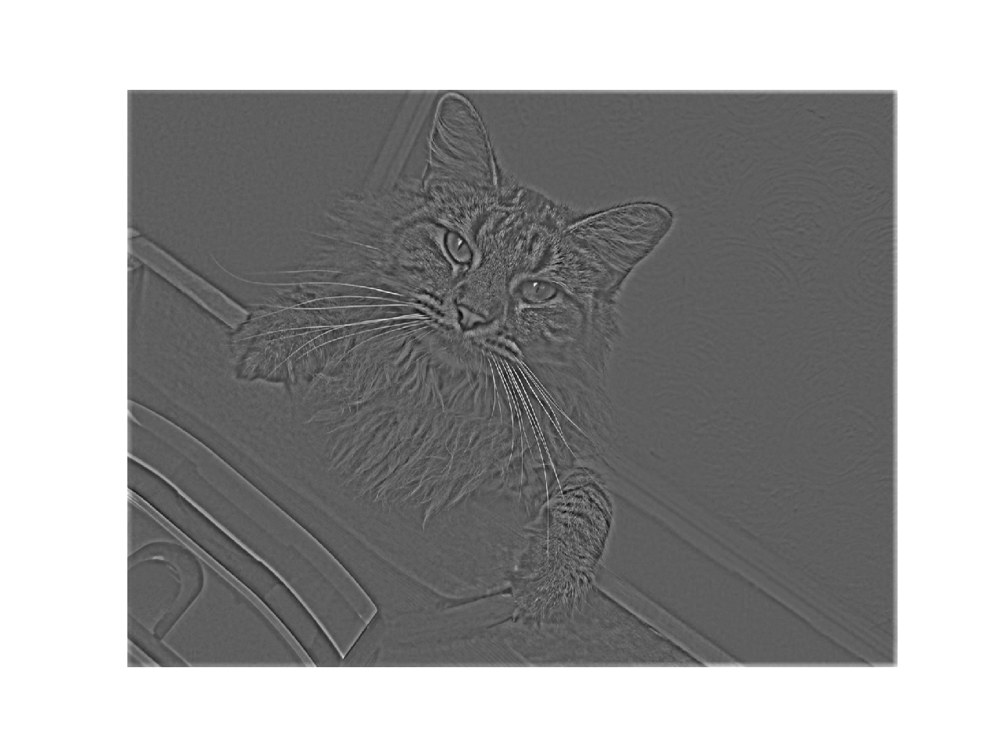

<IPython.core.display.Javascript object>


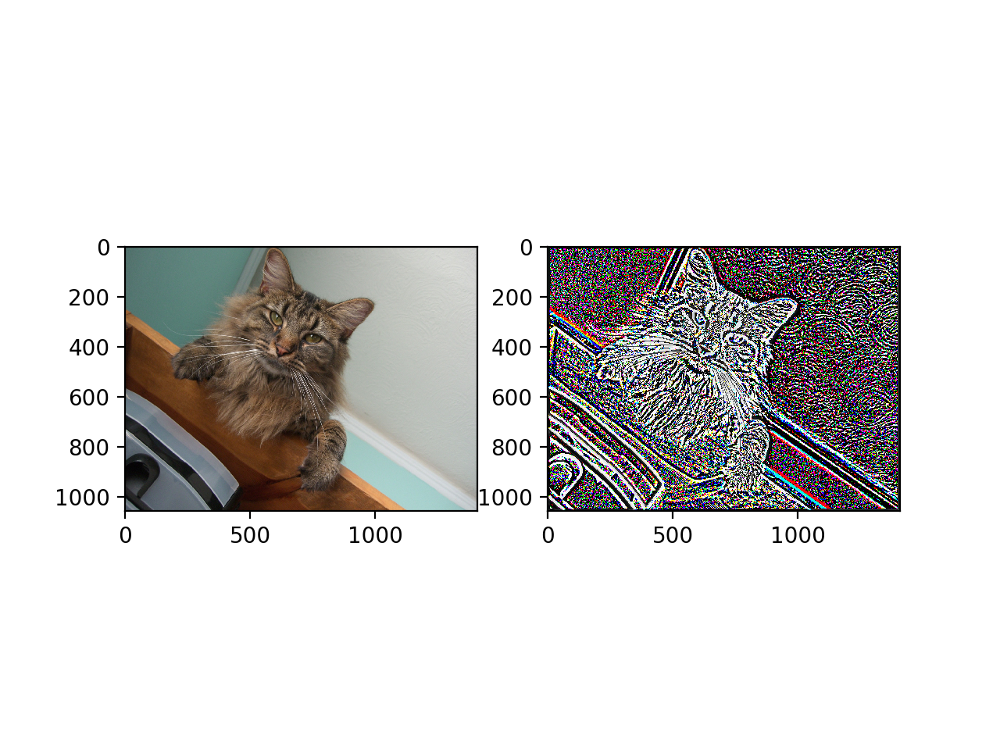

In [9]:
# let's start by considering the enhancement in the RGB domain
im1_file = './nutmeg.jpg'
im1 = cv2.imread(im1_file)

arbitrary_value = 100
kernel_half_size = 10
output_im1 = laplacian_filtering(im1, arbitrary_value, kernel_half_size)

fig, axes = plt.subplots(1,2)
axes[0].imshow(cv2.cvtColor(im1, cv2.COLOR_BGR2RGB))
axes[1].imshow(cv2.cvtColor(output_im1, cv2.COLOR_BGR2RGB))

<IPython.core.display.Javascript object>


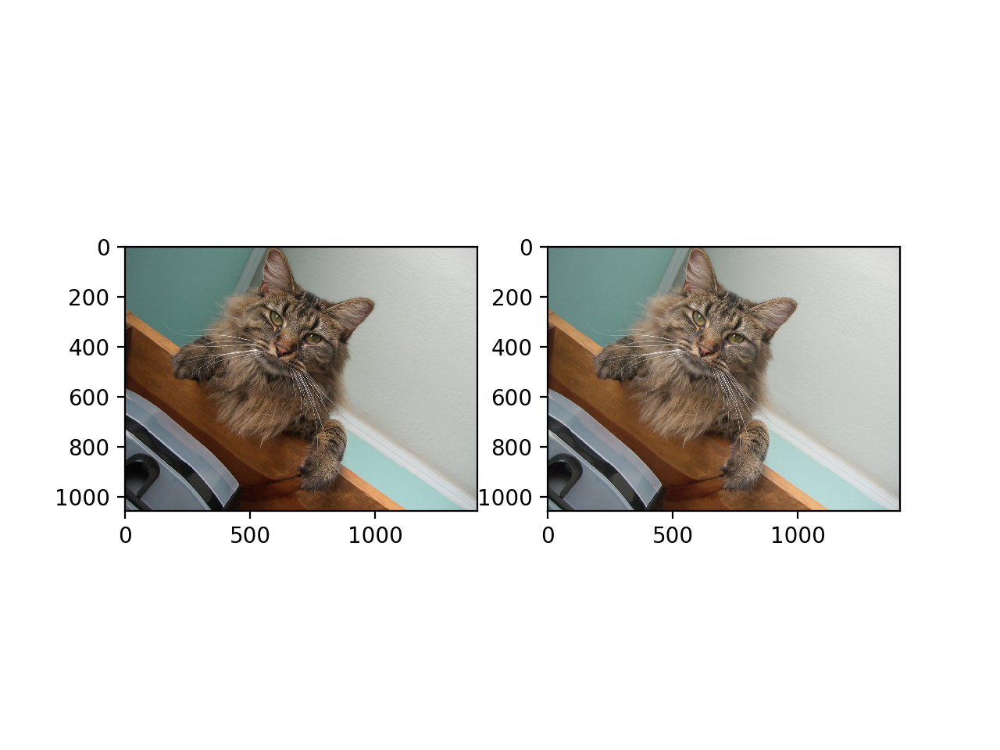

In [10]:
im2_file = './nutmeg.jpg'
im2 = cv2.imread(im2_file)

gamma = 0.8
output_im2 = gamma_correction(im2, gamma)

fig, axes = plt.subplots(1,2)
axes[0].imshow(cv2.cvtColor(im2, cv2.COLOR_BGR2RGB))
axes[1].imshow(output_im2[..., ::-1]) # I don't know why cant I use cv2.cvtColor(output_im2, cv2.COLOR_BGR2RGB))

In [11]:
im3_file = './nutmeg.jpg'
im3 = cv2.imread(im3_file)

alpha = 0.5
output_im3, h, c, h_new, c_new = histogram_equalization(im3, alpha)

<IPython.core.display.Javascript object>


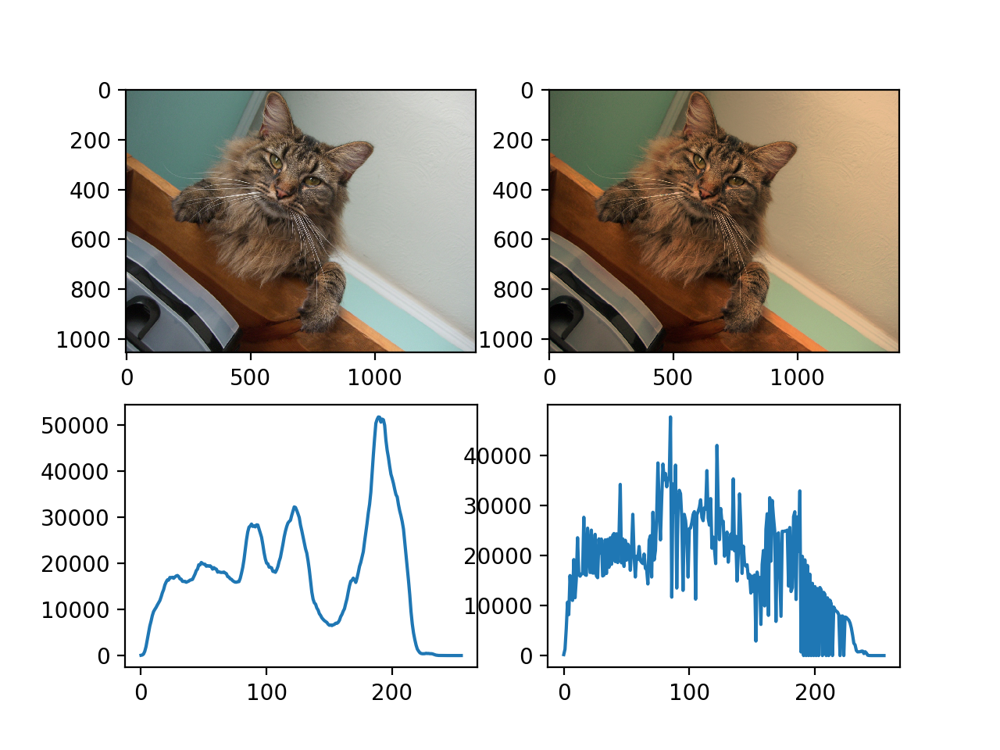

In [16]:
fig, axes = plt.subplots(2,2)
axes[0,0].imshow(cv2.cvtColor(im3, cv2.COLOR_BGR2RGB))
axes[0,1].imshow(cv2.cvtColor(output_im3, cv2.COLOR_BGR2RGB))
axes[1,0].plot(np.arange(len(h_new)),h)
axes[1,1].plot(np.arange(len(h_new)),h_new)


#### Color enhancement 

Now, how to make the colors brighter? You'll find that if you just add some constant to all of the pixel values or multiply them by some factor, you'll make the images lighter, but the colors won't be more vivid. The trick is to work in the correct color space. Convert the images to HSV color space and divide into hue, saturation, and value channels (```hsv = cv2.cvtColor(im,cv2.COLOR_BGR2HSV)``` in OpencCv). 

Then manipulate the appropriate channel(s) to make the colors (but not the intensity) brighter. __Note that you want the values to map between the range defined by the imported library (in OpenCv 0-255), so you shouldn't just add or multiply with some constant.__ Show this with __at least one photograph__. Show the original and enhanced images and explain your method.

In [13]:
# we use the function upper(x/(1+x)*256) to mapping all the positive values into the range [0,255]
from matplotlib.colors import hsv_to_rgb
def color_enhancement(im, factor_h, factor_s, factor_v):
    hsv = cv2.cvtColor(im,cv2.COLOR_BGR2HSV)
    tmp = np.ones(hsv.shape)
    # pixel = [x/(1+x)*256] -> x = pixel/(256-pixel)
    para_arr = hsv/(256-hsv)
    para_arr[:,:,0] = para_arr[:,:,0]*factor_h
    para_arr[:,:,1] = para_arr[:,:,1]*factor_s
    para_arr[:,:,2] = para_arr[:,:,2]*factor_v
    
    tmp = np.ones(hsv.shape)
    new_hsv = para_arr/(para_arr + tmp) * 256
    
    output_im = hsv_to_rgb(new_hsv/256)
    return output_im

<IPython.core.display.Javascript object>


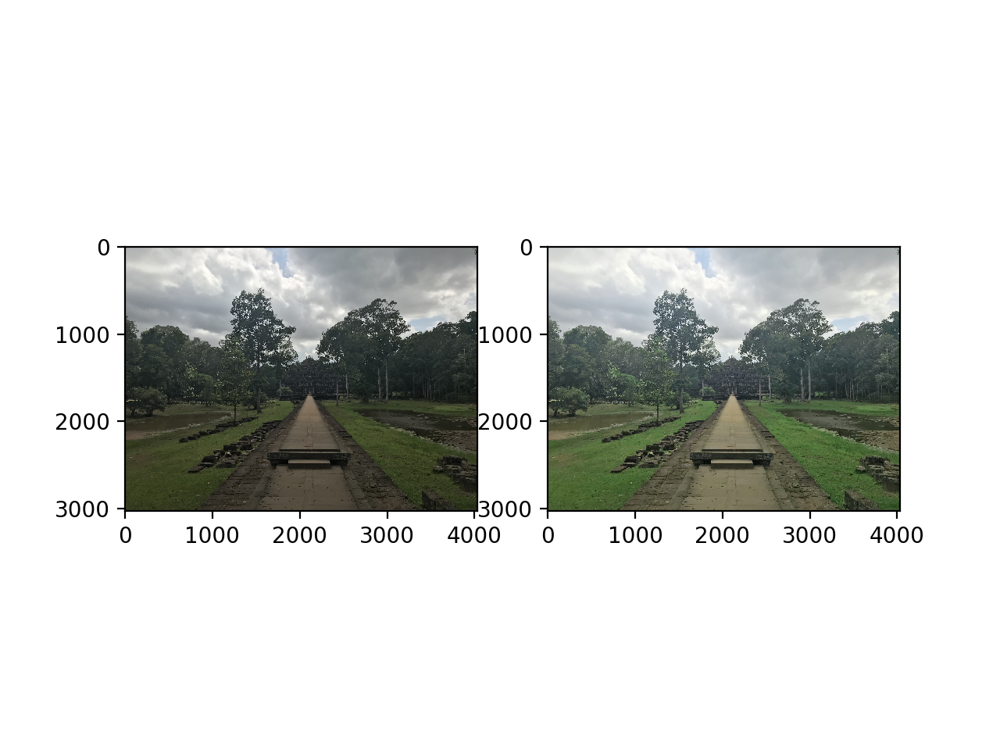

In [300]:
# let's have a look at the result
im4_file = './IMG_0397.jpg'
im4 = cv2.imread(im4_file)
output_im4 = color_enhancement(im4, 2,1,2)


fig, axes = plt.subplots(1,2)
axes[0].imshow(cv2.cvtColor(im4, cv2.COLOR_BGR2RGB))
axes[1].imshow(output_im4)

#### Color shift
Take an image of your choice and create two color-modified versions that are (a) more red; (b) less yellow. Show the original and two modified images and explain how you did it and what color space you've used. Note that you should not change the luminance of the photograph (i.e., don't make it more red just by increasing the values of the red channel). In OpenCv use ```cv2.cvtColor(image, cv2.COLOR_BGR2Lab)``` for converting between RGB and LAB spaces, in case you want to use LAB space.

In [14]:
def color_shift(im, delta_l, delta_a, delta_b):
    Lab_im = cv2.cvtColor(im, cv2.COLOR_BGR2Lab)
    l_layer = Lab_im[:,:,0]
    delta_l_arr = np.ones(l_layer.shape)*delta_l
    a_layer = Lab_im[:,:,1]
    delta_a_arr = np.ones(a_layer.shape)*delta_a
    b_layer = Lab_im[:,:,2]
    delta_b_arr = np.ones(b_layer.shape)*delta_b
    Lab_im[:,:,0] = l_layer*delta_l_arr
    Lab_im[:,:,1] = a_layer*delta_a_arr
    Lab_im[:,:,2] = b_layer*delta_b_arr
    output_im = cv2.cvtColor(Lab_im, cv2.COLOR_Lab2RGB)
    return output_im

<IPython.core.display.Javascript object>


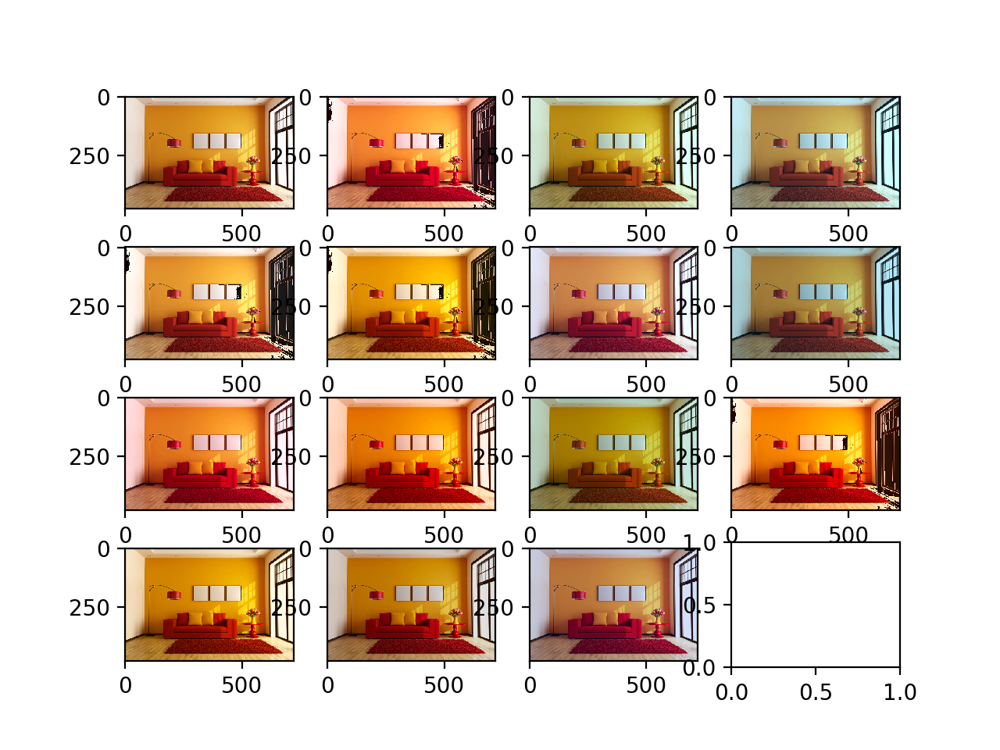

In [306]:
# let's have a look at the result
im5_file = './yellow-red-white-timber.jpg'
im5 = cv2.imread(im5_file)
output1_im5 = color_shift(im5, 1.1,1,1)
output2_im5 = color_shift(im5, 1,1.1,1)
output3_im5 = color_shift(im5, 1,1,1.1)
output4_im5 = color_shift(im5, 1.1,1.1,1)
output5_im5 = color_shift(im5, 1.1,1,1.1)
output6_im5 = color_shift(im5, 1,1.1,1.1)
output7_im5 = color_shift(im5, 0.9,1,1)
output8_im5 = color_shift(im5, 1,0.9,1)
output9_im5 = color_shift(im5, 1,1,0.9)
output10_im5 = color_shift(im5, 0.9,0.9,1)
output11_im5 = color_shift(im5, 0.9,1,0.9)
output12_im5 = color_shift(im5, 1,0.9,0.9)
output13_im5 = color_shift(im5, 0.9,0.9,0.9)
output14_im5 = color_shift(im5, 1.1,1.1,1.1)

fig, axes = plt.subplots(4,4)
axes[0,0].imshow(cv2.cvtColor(im5, cv2.COLOR_BGR2RGB))
axes[1,0].imshow(output1_im5)
axes[2,0].imshow(output2_im5)
axes[3,0].imshow(output3_im5)
axes[0,1].imshow(output4_im5)
axes[1,1].imshow(output5_im5)
axes[2,1].imshow(output6_im5)
axes[3,1].imshow(output7_im5)
axes[0,2].imshow(output8_im5)
axes[1,2].imshow(output9_im5)
axes[2,2].imshow(output10_im5)
axes[3,2].imshow(output11_im5)
axes[0,3].imshow(output12_im5)
axes[1,3].imshow(output13_im5)
axes[2,3].imshow(output14_im5)

#### Bells & Whistles (Extra Points)

- Try using color to enhance the effect of hybrid images. Does it work better to use color for the high-frequency component, the low-frequency component, or both? (5 pts)


In [15]:
# now, reload the fist parts image with color
im3_1_file = "Bengal-tiger.jpg"
im3_2_file = "dog.jpg"

im3_1 = cv2.imread(im3_1_file)
im3_2 = cv2.imread(im3_2_file)

im3_1 = cv2.cvtColor(im3_1, cv2.COLOR_BGR2RGB)
im3_2 = cv2.cvtColor(im3_2, cv2.COLOR_BGR2RGB)

error: OpenCV(4.1.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
fig, axes = plt.subplots(1,2)
axes[0].imshow(im3_1)
axes[1].imshow(im3_2)

In [ ]:
pts_im3_1 = utils.prompt_eye_selection(im3_1)
pts_im3_2 = utils.prompt_eye_selection(im3_2)

In [ ]:
im3_1, im3_2 = utils.align_images(im3_1_file, im3_2_file, pts_im3_1,pts_im3_2,save_images=False)


im3_1 = cv2.cvtColor(im3_1, cv2.COLOR_BGR2RGB)/256
im3_2 = cv2.cvtColor(im3_2, cv2.COLOR_BGR2RGB)/256

fig, axes = plt.subplots(1, 2)
axes[0].imshow(im3_1)
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im3_2)
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [ ]:
arbitrary_value = 20  # you should choose meaningful values; you might want to set to a fraction of image size
cutoff_low = 5
cutoff_high = 8

frequency_im3_1, frequency_im3_2, frequency_fl3_1, frequency_fl3_2 = hybridImage_fft(im3_2, im3_1, cutoff_low, cutoff_high)
im_hybrid3_12 = hybridImage(im3_2, im3_1, cutoff_low, cutoff_high)

In [ ]:
frequency_im3_1_sum = freqency_sum(frequency_im3_1)
frequency_im3_2_sum = freqency_sum(frequency_im3_2)

display_frequency_image(frequency_im3_1_sum)
plt.title('high_freq')
display_frequency_image(frequency_im3_2_sum)
plt.title('low_freq')

In [ ]:
cropped_object = utils.interactive_crop(im_hybrid3_12)

- Illustrate the hybrid image process by implementing Gaussian and Laplacian pyramids and displaying them for your favorite result. This should look similar to Figure 7 in the Oliva et al. paper. (15 pts)


In [ ]:
high_freq_im_arr = []
low_freq_im_arr = []
for i in range(5):
    high_freq_im_arr.append(hybridImage(im3_2, im3_1, 1+3*i, 10))
    low_freq_im_arr.append(hybridImage(im3_2, im3_1, 10, 1+3*i))

print(np.max(high_freq_im_arr[0]))
for i in range(5):
    fig = plt.figure()
    plt.imshow(high_freq_im_arr[i])
    plt.savefig('dog_%i_tiger_%i.png' %(1+3*i, 10))

for i in range(5):
    fig = plt.figure()
    plt.imshow(low_freq_im_arr[i])
    plt.savefig('dog_%i_tiger_%i.png' %(10, 1+3*i))
    



- Do all three image enhancement tasks. (10 pts)

In [ ]:
np.real(-np.Inf+1)